In [1]:
import pandas as pd
cartoon = pd.read_csv('/Users/yutingzhang/Desktop/cartoon_predict.csv')

FileNotFoundError: [Errno 2] No such file or directory: '/Users/yutingzhang/Desktop/cartoon_predict.csv'

In [ ]:
real = pd.read_csv('/Users/yutingzhang/Desktop/real_predict.csv')

In [ ]:
cartoon_mem = cartoon['mem_predict'].tolist()
real_mem = real['mem_predict'].tolist()

In [ ]:
import scipy.stats as stats

In [ ]:
cartoon_mem = stats.zscore(cartoon_mem)
real_mem = stats.zscore(real_mem)
original_mem = stats.zscore(original_mem)
cartoon_original_mem = stats.zscore(original_mem)

In [ ]:
original = pd.read_csv('/Users/yutingzhang/Documents/image_list/full_memorability.csv')

In [ ]:
original_mem = original['original_corrected_memorability'].tolist()
cartoon_original_mem = original['cartoon_corrected_memorability'].tolist()

In [ ]:
x = pd.DataFrame(list(zip(cartoon_mem, cartoon_original_mem)),
                  columns=['cartoon_predict', 'cartoon_mem'])

In [ ]:
import seaborn as sns
sns.scatterplot(data=x, x="cartoon_predict", y="cartoon_mem").set(title='cartoon image prediction versus cartoon image mem')


In [ ]:
x.to_csv('/Users/yutingzhang/Desktop/cartoon_mem_vs_cartoon_predict.csv',index=False)

### plotting

In [2]:
yale = pd.read_csv('/Users/yutingzhang/Documents/real_cartoon/yale_preprocessed.csv')
online = pd.read_csv('/Users/yutingzhang/Documents/real_cartoon/online_preprocessed.csv')

In [3]:
yaleids = yale['ID'].unique().tolist()
onlineids = online['ID'].unique().tolist()
#to remove nans from the list
yaleIDs = [ID for ID in yaleids if str(ID) != 'nan']
onlineIDs = [ID for ID in onlineids if str(ID) != 'nan']
for ids in onlineids:
    yaleids.append(ids)
print(yaleids)
combined = yale.append(online,ignore_index=True)
print(combined)

['lfg25', '72091', '72163', '72115', 'sdm77', '72199', 'ehg29', 'hrm29', '72100', '72241', '72160', '72268', '72190', '72256', 'selma', 'tmm77', '72286', '72166', '72361', '72103', '613807491e522ac4e3de570e', '612740e98f60de7fb83d1bfe', '613817325d7b73e322a1c619', '60fdf27e8375dfaaa382f3fc', '6112c82388e6ead4fb781133', '611aa89a8d790ef5a118c2a4', '6136557069e3f6882200def3', '611e6c95465760711d614803', '6137df1251c2e04128bf62e7', '6136cf83be527a683b8c0b95', '612f2c10fdb761f0f5c2a743', '6007a01f5c0bb62c1524e7ca', '61355607cccd63856e25d7e9']
                             ID                                   Image  \
0                         lfg25     Google_1_Clara_Hutchison_5_oval.jpg   
1                         lfg25      Google_1_Clarence_Borst_3_oval.jpg   
2                         lfg25         Google_1_Clara_Leyba_1_oval.jpg   
3                         lfg25  Google_1_Clarence_Zielinski_7_oval.jpg   
4                         lfg25      Google_1_Curtis_Coggins_1_oval.jpg   
...  

In [4]:
final_list

NameError: name 'final_list' is not defined

In [20]:
excluded

[]

In [27]:
ids = cartoonMem['ID'].unique().tolist()
excluded = []
for ID in ids:
    try:
        selected = cartoonMem.loc[cartoonMem['ID']==ID]
        if selected['performancesequence'].tolist()[-2] == '0':
            if selected['performancesequence'].tolist()[-1]=='0':
                excluded.append(ID)
    except IndexError:
        excluded.append(ID)

In [10]:
final_list = ids
final_list_1 = [x for x in final_list if x not in excluded]

In [11]:
final_list = final_list_1

In [9]:
import os
directory1 = '/Users/yutingzhang/Documents/stimuli/target/target160-cropped/'
directory2 = '/Users/yutingzhang/Documents/stimuli/target/target80-cropped/'
image_list = []
for file in os.listdir(directory1):
    filename = os.fsdecode(file)
    image_list.append(filename)
for file in os.listdir(directory2):
    filename = os.fsdecode(file)
    image_list.append(filename)

In [18]:
final_list

['lfg25',
 '72091',
 '72163',
 '72115',
 'sdm77',
 '72199',
 'ehg29',
 'hrm29',
 '72100',
 '72160',
 '72268',
 '72190',
 'selma',
 'tmm77',
 '72286',
 '72166',
 '613807491e522ac4e3de570e',
 '611aa89a8d790ef5a118c2a4',
 '6136557069e3f6882200def3',
 '611e6c95465760711d614803',
 '6137df1251c2e04128bf62e7',
 '6136cf83be527a683b8c0b95',
 '612f2c10fdb761f0f5c2a743',
 '6007a01f5c0bb62c1524e7ca',
 '61355607cccd63856e25d7e9']

In [13]:
fa_list = []
hit_list = []
for IDs in final_list:
    selected = final.loc[final['ID']==IDs]
    #fa_candidate = selected.loc[selected['typesequence']==1 | selected['typesequence']==3]
    fa_candidate_1 = selected[selected.typesequence==1]
    fa_candidate_2 = selected[selected.typesequence==3]
    fa_candidate = fa_candidate_1.append(fa_candidate_2)
    hit_candidate = selected.loc[selected['typesequence']==2]
    fa = fa_candidate.loc[fa_candidate['perfsequence']==13]
    hit = hit_candidate.loc[hit_candidate['perfsequence']==11]
    hit_rate = len(hit)/len(hit_candidate)
    fa_rate = len(fa)/len(fa_candidate)
    if fa_rate == 0.0:
        #If fa is 0%, we adjust it to 1/(2*(num of new trials))
        fa_rate = 1/(2*len(fa_candidate))
    fa_list.append(fa_rate)
    hit_list.append(hit_rate)

In [15]:
hit_list

[0.6036036036036037,
 0.31896551724137934,
 0.4642857142857143,
 0.5254237288135594,
 0.0782608695652174,
 0.6752136752136753,
 0.38095238095238093,
 0.36936936936936937,
 0.2727272727272727,
 0.125,
 0.1891891891891892,
 0.5225225225225225,
 0.514018691588785,
 0.7962962962962963,
 0.5327102803738317,
 0.8166666666666667,
 0.3364485981308411,
 0.39097744360902253,
 0.6403508771929824,
 0.6521739130434783,
 0.7058823529411765,
 0.5652173913043478,
 0.9736842105263158,
 0.5350877192982456,
 0.819047619047619]

In [18]:
import scipy.stats as stats
zscored_hit = stats.norm.ppf(hit_list)
zscored_fa = stats.norm.ppf(fa_list)

In [39]:
zscored_fa

array([-2.20312121, -2.70294304, -2.92573583, -2.71305189, -1.77679865,
       -2.70408313, -2.69248378, -2.46507048, -2.69129898, -2.92680298,
       -2.70179863, -2.70408313, -2.92680298, -2.31489724, -2.6994967 ,
       -1.82329062, -2.31099134, -2.70747777, -2.92680298, -1.59834762,
       -2.92680298, -2.92573583, -2.70294304, -2.70294304, -2.02806914])

In [19]:
diff_list = zscored_hit - zscored_fa

In [30]:
images = []
hit_list = []
fa_list = []
diff_list = []
for image in image_list:
    selected = final.loc[final['Image']==image]
    n = len(selected)
    try:
        falsealarm = selected.loc[selected['perfsequence']==13]
        hit = selected.loc[selected['perfsequence']==11]
        n_falsealarm = len(falsealarm)
        n_hit = len(hit)
        falsealarm_rate = float(n_falsealarm)/float(n)
        hit_rate = float(n_hit)/float(n)
        hit_list.append(hit_rate)
        fa_list.append(falsealarm_rate)
        #diff = hit_rate-falsealarm_rate
        images.append(image)
        #diff_list.append(diff)
    except ZeroDivisionError:
        continue

In [34]:
hit_list

[0.22857142857142856,
 0.0625,
 0.17647058823529413,
 0.0625,
 0.25,
 0.35294117647058826,
 0.2647058823529412,
 0.25,
 0.1891891891891892,
 0.1875,
 0.0625,
 0.25,
 0.1875,
 0.1875,
 0.16666666666666666,
 0.25,
 0.25,
 0.3125,
 0.1875,
 0.18181818181818182,
 0.23529411764705882,
 0.0,
 0.25,
 0.2857142857142857,
 0.125,
 0.22857142857142856,
 0.22857142857142856,
 0.125,
 0.25,
 0.11428571428571428,
 0.18181818181818182,
 0.0625,
 0.3125,
 0.25,
 0.25,
 0.21212121212121213,
 0.3125,
 0.1875,
 0.3125,
 0.17647058823529413,
 0.17647058823529413,
 0.35294117647058826,
 0.2857142857142857,
 0.23529411764705882,
 0.2777777777777778,
 0.14705882352941177,
 0.1875,
 0.25,
 0.23529411764705882,
 0.3125,
 0.3235294117647059,
 0.0625,
 0.25,
 0.23529411764705882,
 0.125,
 0.3235294117647059,
 0.0625,
 0.125,
 0.375,
 0.23529411764705882,
 0.1875,
 0.23529411764705882,
 0.35294117647058826,
 0.2,
 0.17647058823529413,
 0.25,
 0.20588235294117646,
 0.38235294117647056,
 0.2647058823529412,
 0.25,

In [32]:
import scipy.stats as stats
zscored_hit = stats.norm.ppf(hit_list)
zscored_fa = stats.norm.ppf(fa_list)
#diff = zscored_hit-zscored_fa
print(zscored_fa)

[-1.9022165         -inf        -inf        -inf        -inf        -inf
        -inf        -inf        -inf -1.86273187        -inf        -inf
        -inf        -inf        -inf        -inf        -inf        -inf
        -inf        -inf        -inf        -inf        -inf        -inf
        -inf -1.9022165         -inf        -inf        -inf        -inf
        -inf        -inf        -inf        -inf        -inf        -inf
        -inf        -inf        -inf        -inf        -inf        -inf
 -1.9022165         -inf -1.91450583        -inf        -inf        -inf
        -inf        -inf        -inf        -inf -1.86273187        -inf
        -inf        -inf        -inf        -inf        -inf        -inf
        -inf        -inf -1.88950996 -1.9022165         -inf        -inf
        -inf        -inf -1.88950996        -inf        -inf        -inf
        -inf        -inf        -inf -1.87635856 -1.53412054        -inf
        -inf        -inf        -inf        -inf   

In [21]:
# replace -inf by the following values: 
#For hit rate, if hit is 100%, we adjust it to 1-(1/2*(num of old trials)). 
#If hit is 0%, we adjust it to 1/(2*(num of old trials)).
#For false alarm rate, if fa is 100%, we adjust it to 1-(1/2*(num of new trials)). 
#If fa is 0%, we adjust it to 1/(2*(num of new trials)).
for i in range(len(zscored_fa)):
    fa = zscored_fa[i]
    if -5<fa<5:
        continue
    else:
        image = images[i]
        selected = final.loc[final['Image']==image]
        new = selected.loc[selected['typesequence']==1]
        length = len(new['Image'])
        zscored_fa[i] = 1/(2*length)

In [22]:
for i in range(len(zscored_hit)):
    hit = zscored_hit[i]
    if -5<hit<5:
        continue
    else:
        image = images[i]
        selected = final.loc[final['Image']==image]
        new = selected.loc[selected['typesequence']==2]
        length = len(new['Image'])
        zscored_hit[i] = 1/(2*length)

In [23]:
zscored_fa

array([-1.9022165 ,  0.0625    ,  0.02941176,  0.0625    ,  0.0625    ,
        0.02941176,  0.02941176,  0.0625    ,  0.02777778, -1.86273187,
        0.0625    ,  0.0625    ,  0.0625    ,  0.0625    ,  0.05      ,
        0.0625    ,  0.0625    ,  0.0625    ,  0.0625    ,  0.03125   ,
        0.03125   ,  0.5       ,  0.0625    ,  0.02777778,  0.0625    ,
       -1.9022165 ,  0.02777778,  0.0625    ,  0.0625    ,  0.02941176,
        0.03125   ,  0.0625    ,  0.0625    ,  0.0625    ,  0.0625    ,
        0.03333333,  0.0625    ,  0.0625    ,  0.0625    ,  0.0625    ,
        0.02941176,  0.02941176, -1.9022165 ,  0.02941176, -1.91450583,
        0.02941176,  0.0625    ,  0.0625    ,  0.02941176,  0.0625    ,
        0.02941176,  0.0625    , -1.86273187,  0.02941176,  0.0625    ,
        0.02941176,  0.0625    ,  0.0625    ,  0.0625    ,  0.02941176,
        0.0625    ,  0.02941176, -1.88950996, -1.9022165 ,  0.0625    ,
        0.0625    ,  0.02941176,  0.02941176, -1.88950996,  0.06

In [46]:
images = []
diff_list = []
for image in image_list:
    selected = combined.loc[combined['Image']==image]
    n = len(selected)
    try:
        falsealarm = selected.loc[selected['perfsequence']==13]
        hit = selected.loc[selected['perfsequence']==11]
        n_falsealarm = len(falsealarm)
        n_hit = len(hit)
        falsealarm_rate = float(n_falsealarm)/float(n)
        hit_rate = float(n_hit)/float(n)
        diff = hit_rate-falsealarm_rate
        images.append(image)
        diff_list.append(diff)
    except ZeroDivisionError:
        continue

In [29]:
zscored_fa

array([-1.9022165 ,  0.0625    ,  0.02941176,  0.0625    ,  0.0625    ,
        0.02941176,  0.02941176,  0.0625    ,  0.02777778, -1.86273187,
        0.0625    ,  0.0625    ,  0.0625    ,  0.0625    ,  0.05      ,
        0.0625    ,  0.0625    ,  0.0625    ,  0.0625    ,  0.03125   ,
        0.03125   ,  0.5       ,  0.0625    ,  0.02777778,  0.0625    ,
       -1.9022165 ,  0.02777778,  0.0625    ,  0.0625    ,  0.02941176,
        0.03125   ,  0.0625    ,  0.0625    ,  0.0625    ,  0.0625    ,
        0.03333333,  0.0625    ,  0.0625    ,  0.0625    ,  0.0625    ,
        0.02941176,  0.02941176, -1.9022165 ,  0.02941176, -1.91450583,
        0.02941176,  0.0625    ,  0.0625    ,  0.02941176,  0.0625    ,
        0.02941176,  0.0625    , -1.86273187,  0.02941176,  0.0625    ,
        0.02941176,  0.0625    ,  0.0625    ,  0.0625    ,  0.02941176,
        0.0625    ,  0.02941176, -1.88950996, -1.9022165 ,  0.0625    ,
        0.0625    ,  0.02941176,  0.02941176, -1.88950996,  0.06

In [25]:
zscored_hit_prime = stats.zscore(zscored_hit)
zscored_fa_prime = stats.zscore(zscored_fa)

In [26]:
diff_list = zscored_hit_prime-zscored_fa_prime

In [27]:
diff_list

array([ 2.64678371, -3.03445168, -0.99807084, -3.03445168, -0.21595658,
        0.81017211, -0.01446809, -0.21595658, -0.83808545,  2.11391846,
       -3.03445168, -0.21595658, -0.9132003 , -0.9132003 , -1.15674592,
       -0.21595658, -0.21595658,  0.39294685, -0.9132003 , -0.93393866,
       -0.32102782,  2.94697656, -0.21595658,  0.19451468, -1.77617062,
        2.64678371, -0.38782317, -1.77617062, -0.21595658, -1.9002044 ,
       -0.93393866, -3.03445168,  0.39294685, -0.21595658, -0.21595658,
       -0.5786032 ,  0.39294685, -0.9132003 ,  0.39294685, -1.05009679,
       -0.99807084,  0.81017211,  3.22912156, -0.31813749,  3.1713716 ,
       -1.39227849, -0.9132003 , -0.21595658, -0.31813749,  0.39294685,
        0.54636574, -3.03445168,  2.81116219, -0.31813749, -1.77617062,
        0.54636574, -3.03445168, -1.77617062,  0.95077986, -0.31813749,
       -0.9132003 , -0.31813749,  3.82736919,  2.32526685, -1.05009679,
       -0.21595658, -0.64361612,  1.06619166,  3.00272899, -0.21

In [43]:
excluded

['72241',
 '72256',
 '72361',
 '72103',
 '612740e98f60de7fb83d1bfe',
 '613817325d7b73e322a1c619',
 '60fdf27e8375dfaaa382f3fc',
 '6112c82388e6ead4fb781133']

In [2]:
import pandas as pd
file_path = '/Users/yutingzhang/Desktop/cartoonMem_online_test_psychpool.txt'
cartoonMem = pd.read_csv(file_path,sep = '\t',engine = 'python', names=['ID','random','image','typesequence','performancesequence','RT','web','sequence'])



In [5]:
len(cartoonMem['sequence'].unique().tolist())

74

In [3]:
len(cartoonMem['ID'].unique().tolist())

68

In [50]:
len(cartoonMem['sequence'].unique().tolist())

25

[Text(0, 0, 'Participants')]

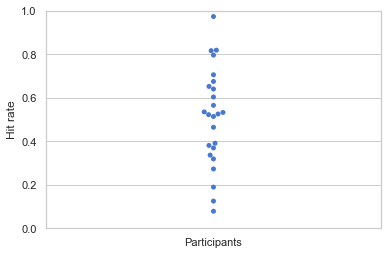

In [25]:
import seaborn as sns
sns.set_theme(style="whitegrid", palette="muted")
ax = sns.swarmplot(data=hit_list)
ax.set(xlabel="",ylabel="Hit rate",ylim=(0, 1), title="")
ax.set_xticklabels(['Participants'])

[Text(0, 0, 'Participants')]

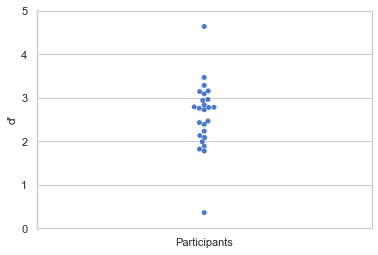

In [26]:
sns.set_theme(style="whitegrid", palette="muted")
ax = sns.swarmplot(data=diff_list)
ax.set(xlabel="",ylabel="d'",ylim=(0, 5),title="")
ax.set_xticklabels(['Participants'])

[Text(0.5, 0, 'zscored_hit_rate-zscored_false_alarm_rate'),
 Text(0.5, 1.0, 'Histogram for zscored hit rate-zscored false alarm rate after exclusion')]

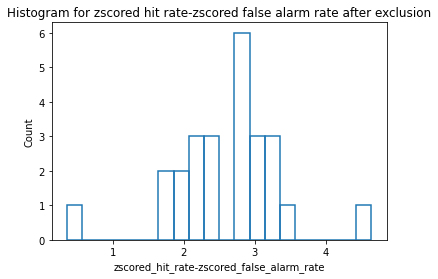

In [27]:
import seaborn as sns
sns.histplot(data = diff_list,bins=20,fill=False).set(xlabel ="zscored_hit_rate-zscored_false_alarm_rate", title ='Histogram for zscored hit rate-zscored false alarm rate after exclusion')

In [67]:
len(yaleids)

25

In [47]:
import scipy.stats as stats
import numpy as np
stats.ttest_1samp(np.asarray(diff_list),0)

Ttest_1sampResult(statistic=33.474356425685464, pvalue=2.0131241320839755e-74)

In [ ]:
statistic=1.962252237246196e-15, pvalue=0.9999999999999984
statistic=33.474356425685464, pvalue=2.0131241320839755e-74

***Data preprocessing to put in the correct format starts from here***

In [9]:
import pandas as pd
file_path = '/Users/yutingzhang/Documents/real_cartoon/online_preprocessed.csv' 

cartoonMem = pd.read_csv(file_path,sep = '\t',engine = 'python', names=['ID','random','image','typesequence','performancesequence','RT','web','sequence'])

len(cartoonMem['ID'].unique().tolist())

13

In [29]:
#read in the csv file
import pandas as pd
file_path = '/Users/yutingzhang/Downloads/cartoonMem_online_test_psychpool.txt' 
cartoonMem = pd.read_csv(file_path,sep = '\t',engine = 'python', names=['ID','random','image','typesequence','performancesequence','RT','web','sequence'])
ids = cartoonMem['ID'].unique().tolist()
#to remove nans from the list
#cleanedIDs = [ID for ID in ids if str(ID) != 'nan']
selected = cartoonMem.loc[cartoonMem['ID']!='nan']

In [28]:
selected.loc[selected['ID']=='nan']

,ID,random,image,typesequence,performancesequence,RT,web,sequence


In [3]:
#script used if you have the sequence with its corresponding participant
from itertools import repeat
directory = '/Users/yutingzhang/Downloads/new_index/'
all_data = []
for ids in cleanedIDs:
    index = cartoonMem.loc[cartoonMem['ID']==str(ids)]['sequence'].unique().tolist()
    len_index = len(index)
    if len_index==1:
        i = index[0]
    elif len_index!=1:
        i = index[-1]
    typesequence = pd.read_json(directory+str(i)+'_type.json')[0].tolist()
    imagesequence = pd.read_json(directory+str(i)+'.json')[0].tolist()
    image_list = []
    for img in imagesequence:
        img = img.replace('http://camplabstudies.space/YZ/CartoonFaceMem/pilotStudy(120+120)/real_images/','')
        img = img.replace('http://camplabstudies.space/YZ/CartoonFaceMem/pilotStudy(120+120)/cartoon_images/','')
        image_list.append(img)
    persequence = []
    image = []
    type1 = []
    selected = cartoonMem.loc[cartoonMem['ID']==str(ids)]
    for i in range(len(image_list)):
        images = image_list[i]
        types = typesequence[i]
        select = selected.loc[selected['image']==images]
        select = select.loc[select['typesequence']==str(types)]
        try:
            perf = select['performancesequence'].tolist()[0]
            persequence.append(perf)
        except IndexError:
            persequence.append(0)
    print(persequence)
    #create dataset from lists with IDs
    ID = []
    ID.extend(repeat(ids,len(persequence)))
    print(ID)
    dataset = pd.DataFrame(list(zip(ID, image_list,typesequence,persequence)),columns =['ID', 'Image','typesequence','perfsequence'])
    #print(dataset)
    if len(all_data)==0:
        all_data = dataset
    elif len(all_data)!=0:
        all_data = all_data.append(dataset)

['14', '14', '14', '14', '14', '14', '14', '14', '14', '12', '14', '14', '11', '14', '14', '14', '14', '14', '14', '12', '14', '14', '12', '14', '14', '14', '14', '14', '14', '11', '14', '14', '11', '14', '14', '14', '14', '11', '14', '14', '14', '14', '11', '14', '14', '14', '14', '14', '14', '12', '14', '14', '11', '14', '14', '14', '11', '14', '14', '14', '11', '11', '14', '14', '14', '11', '14', '14', '14', '11', '11', '14', '14', '11', '14', '14', '11', '14', '14', '11', '14', '12', '11', '14', '14', '14', '11', '11', '14', '14', '14', '14', '14', '11', '11', '14', '14', '11', '14', '12', '11', '14', '14', '14', '12', '14', '11', '11', '14', '14', '11', '11', '14', '14', '14', '11', '14', '14', '14', '11', '14', '14', '12', '14', '12', '14', '11', '14', '14', '11', '11', '14', '14', '14', '12', '14', '11', '14', '14', '11', '11', '14', '14', '14', '11', '14', '14', '11', '14', '11', '14', '12', '14', '14', '11', '11', '14', '12', '11', '14', '14', '14', '11', '14', '14', '11', '14

['14', '14', '14', '14', '14', '14', '12', '14', '14', '14', '14', '11', '14', '14', '14', '14', '11', '14', '14', '14', '14', '14', '14', '14', '12', '11', '14', '14', '14', '14', '14', '14', '14', '11', '14', '14', '11', '14', '14', '14', '14', '11', '14', '14', '14', '14', '11', '14', '14', '14', '11', '14', '14', '14', '14', '14', '14', '14', '14', '11', '14', '14', '14', '11', '11', '12', '14', '11', '14', '14', '14', '12', '14', '14', '11', '14', '11', '11', '14', '14', '14', '11', '14', '11', '14', '14', '14', '12', '11', '14', '14', '12', '11', '14', '14', '11', '12', '14', '14', '14', '12', '14', '14', '12', '14', '14', '12', '14', '14', '11', '12', '14', '14', '14', '11', '14', '14', '12', '14', '12', '14', '14', '11', '14', '12', '12', '12', '14', '14', '14', '14', '11', '14', '12', '14', '14', '12', '11', '14', '14', '14', '11', '11', '14', '14', '14', '14', '11', '11', '14', '14', '14', '14', '12', '14', '14', '14', '11', '14', '14', '11', '12', '12', '14', '14', '14', '14

['14', '14', '14', '14', '14', '14', '12', '14', '14', '14', '14', '14', '14', '14', '12', '12', '14', '14', '14', '14', '14', '14', '14', '12', '14', '14', '12', '14', '14', '14', '14', '14', '13', '12', '14', '12', '14', '14', '14', '14', '14', '14', '12', '14', '13', '14', '14', '14', '11', '14', '14', '14', '12', '14', '14', '14', '12', '14', '14', '14', '12', '12', '14', '14', '14', '12', '14', '12', '14', '14', '14', '14', '12', '14', '12', '14', '11', '12', '14', '14', '12', '14', '14', '14', '12', '14', '14', '14', '12', '12', '14', '14', '12', '12', '11', '12', '14', '14', '12', '14', '12', '14', '14', '12', '14', '14', '14', '14', '12', '12', '12', '12', '14', '14', '14', '12', '14', '11', '14', '13', '12', '14', '14', '14', '12', '12', '14', '14', '12', '14', '14', '14', '14', '12', '12', '12', '12', '14', '14', '14', '14', '14', '12', '11', '14', '12', '14', '14', '14', '12', '12', '11', '14', '14', '12', '14', '12', '14', '14', '14', '12', '14', '14', '12', '13', '12', '12

['14', '14', '14', '14', '14', '14', '14', '14', '11', '14', '14', '11', '14', '14', '14', '11', '14', '14', '14', '14', '14', '14', '12', '14', '14', '14', '14', '11', '14', '14', '14', '14', '12', '14', '14', '14', '14', '14', '14', '12', '14', '14', '14', '14', '11', '12', '14', '14', '14', '14', '14', '14', '11', '14', '14', '14', '14', '12', '14', '14', '14', '11', '14', '14', '11', '11', '14', '14', '12', '14', '11', '12', '14', '14', '14', '11', '12', '14', '14', '14', '12', '14', '14', '12', '14', '12', '14', '14', '12', '14', '11', '12', '14', '14', '14', '14', '11', '14', '14', '11', '14', '14', '11', '14', '11', '14', '14', '14', '12', '11', '14', '14', '14', '11', '12', '14', '14', '11', '14', '12', '11', '11', '14', '14', '14', '14', '11', '14', '14', '11', '14', '12', '14', '14', '11', '14', '11', '11', '14', '14', '14', '14', '12', '14', '12', '12', '14', '11', '12', '14', '12', '11', '14', '14', '12', '14', '14', '14', '11', '14', '11', '12', '12', '14', '14', '14', '11

['14', '14', '14', '14', '14', '14', '14', '14', '12', '14', '12', '14', '14', '14', '14', '14', '14', '14', '11', '14', '11', '14', '14', '14', '14', '14', '14', '14', '14', '12', '14', '14', '11', '14', '14', '14', '14', '14', '14', '11', '14', '14', '14', '12', '14', '14', '14', '14', '14', '12', '14', '11', '14', '14', '14', '14', '14', '12', '14', '14', '14', '12', '14', '14', '11', '14', '12', '12', '14', '14', '14', '11', '14', '14', '12', '14', '14', '11', '14', '11', '12', '12', '14', '14', '14', '11', '14', '14', '14', '12', '14', '14', '11', '14', '12', '14', '14', '12', '12', '14', '14', '14', '12', '12', '14', '14', '14', '14', '12', '12', '11', '14', '14', '11', '14', '12', '14', '14', '12', '14', '14', '11', '14', '12', '14', '12', '14', '11', '14', '14', '14', '14', '11', '14', '11', '11', '14', '14', '14', '12', '14', '11', '14', '11', '14', '14', '14', '12', '14', '12', '12', '12', '14', '14', '12', '14', '12', '14', '14', '11', '14', '11', '14', '14', '12', '14', '12

['14', '14', '14', '14', '14', '14', '14', '14', '11', '14', '14', '14', '14', '11', '14', '14', '14', '12', '14', '14', '14', '12', '14', '14', '14', '14', '11', '14', '14', '14', '14', '12', '14', '14', '14', '12', '14', '14', '14', '14', '12', '14', '14', '14', '14', '14', '14', '14', '14', '12', '14', '12', '14', '14', '14', '14', '12', '14', '14', '14', '14', '14', '12', '14', '12', '11', '14', '12', '14', '14', '14', '14', '12', '11', '14', '14', '14', '12', '12', '14', '14', '12', '14', '12', '14', '12', '14', '14', '11', '14', '14', '14', '12', '14', '12', '14', '12', '14', '12', '14', '12', '14', '14', '14', '12', '14', '14', '12', '12', '14', '12', '12', '14', '14', '14', '14', '12', '14', '14', '11', '12', '14', '14', '12', '14', '14', '14', '12', '14', '12', '14', '12', '14', '11', '14', '14', '14', '12', '11', '14', '12', '14', '12', '14', '14', '11', '12', '14', '14', '14', '14', '14', '11', '14', '12', '14', '12', '14', '12', '14', '14', '14', '12', '12', '14', '14', '14

['14', '14', '14', '14', '14', '14', '14', '11', '14', '14', '14', '14', '14', '12', '14', '12', '14', '14', '14', '14', '14', '12', '14', '14', '14', '14', '14', '11', '14', '14', '14', '12', '14', '14', '14', '14', '14', '14', '14', '11', '14', '14', '14', '14', '11', '12', '14', '14', '14', '14', '14', '14', '14', '11', '14', '14', '14', '14', '11', '14', '11', '14', '14', '14', '12', '14', '11', '14', '14', '11', '14', '14', '14', '11', '11', '14', '14', '12', '11', '14', '14', '14', '12', '14', '12', '14', '14', '12', '14', '11', '14', '14', '11', '11', '14', '11', '14', '14', '14', '12', '14', '11', '11', '14', '14', '14', '14', '11', '14', '12', '14', '11', '12', '14', '14', '14', '11', '11', '14', '14', '14', '12', '11', '14', '14', '11', '14', '14', '11', '14', '14', '11', '14', '11', '14', '11', '14', '14', '14', '12', '14', '12', '14', '14', '11', '11', '14', '14', '11', '14', '13', '11', '14', '14', '11', '14', '14', '14', '11', '12', '14', '12', '14', '12', '14', '14', '14

['14', '14', '14', '14', '14', '14', '11', '14', '14', '14', '14', '11', '14', '14', '14', '11', '14', '14', '14', '14', '14', '11', '14', '14', '14', '14', '14', '14', '14', '12', '14', '11', '14', '14', '14', '14', '14', '14', '14', '11', '14', '14', '14', '14', '12', '14', '14', '14', '14', '11', '11', '14', '14', '14', '14', '14', '14', '14', '14', '11', '11', '14', '14', '12', '14', '14', '14', '14', '11', '12', '14', '14', '11', '14', '12', '12', '14', '12', '14', '14', '11', '14', '12', '14', '14', '14', '14', '11', '12', '14', '14', '12', '14', '14', '11', '11', '11', '14', '14', '14', '14', '12', '11', '14', '14', '14', '12', '14', '14', '12', '14', '11', '14', '14', '12', '14', '14', '11', '14', '12', '11', '14', '14', '11', '14', '11', '14', '14', '14', '11', '14', '14', '12', '14', '11', '14', '14', '11', '14', '12', '14', '11', '12', '14', '14', '12', '12', '14', '14', '14', '14', '14', '14', '14', '11', '14', '12', '14', '14', '11', '14', '14', '11', '14', '11', '14', '14

['14', '14', '14', '14', '14', '14', '14', '14', '14', '14', '14', '12', '14', '14', '14', '14', '11', '14', '11', '14', '14', '14', '14', '14', '14', '12', '14', '14', '11', '14', '14', '14', '14', '11', '14', '14', '14', '14', '11', '14', '14', '14', '14', '14', '14', '12', '14', '14', '14', '14', '14', '12', '14', '14', '14', '14', '11', '14', '11', '12', '14', '14', '14', '14', '14', '14', '14', '11', '12', '11', '14', '14', '14', '14', '11', '14', '14', '11', '14', '14', '14', '12', '12', '11', '12', '14', '14', '14', '14', '14', '12', '14', '11', '14', '14', '12', '14', '12', '12', '14', '12', '14', '14', '11', '12', '14', '14', '14', '14', '12', '11', '14', '14', '14', '12', '14', '14', '12', '14', '14', '11', '14', '12', '14', '14', '12', '14', '12', '12', '14', '14', '14', '11', '14', '12', '14', '12', '14', '11', '14', '14', '12', '14', '11', '12', '11', '14', '14', '12', '11', '11', '14', '14', '14', '14', '14', '14', '12', '12', '12', '14', '14', '14', '12', '14', '11', '14

['14', '14', '14', '14', '14', '14', '14', '14', '14', '12', '14', '14', '14', '11', '14', '14', '14', '14', '11', '14', '14', '14', '14', '11', '14', '14', '12', '14', '14', '14', '14', '14', '14', '12', '14', '11', '14', '14', '14', '14', '14', '14', '12', '14', '14', '14', '14', '14', '11', '14', '14', '11', '14', '14', '14', '14', '14', '14', '11', '14', '14', '14', '14', '11', '12', '12', '14', '14', '14', '12', '14', '14', '12', '14', '11', '14', '14', '12', '14', '12', '14', '14', '12', '11', '14', '14', '11', '14', '14', '12', '11', '14', '14', '11', '14', '14', '12', '14', '11', '14', '11', '11', '14', '14', '14', '11', '14', '14', '14', '11', '12', '14', '14', '11', '14', '11', '11', '14', '14', '14', '14', '14', '14', '12', '11', '11', '14', '11', '14', '14', '14', '11', '14', '12', '14', '11', '14', '11', '14', '14', '11', '14', '14', '12', '14', '14', '11', '11', '14', '14', '13', '14', '14', '12', '14', '14', '14', '14', '14', '12', '11', '12', '12', '14', '14', '14', '11

In [6]:
all_data['ID'].unique().tolist()

['lfg25',
 '72091',
 '72163',
 '72115',
 'sdm77',
 '72199',
 'ehg29',
 'hrm29',
 '72100',
 '72241',
 '72160',
 '72268',
 '72190',
 '72256',
 'selma',
 'tmm77',
 '72286',
 '72166',
 '72361',
 '72103']

In [7]:
all_data.to_csv('/Users/yutingzhang/Documents/real_cartoon/yale_preprocessed.csv',index=False)

In [22]:
#get each target image and calculate d' for each #for yale participants and online participants separately

,ID,Image,typesequence,perfsequence
0,lfg25,Google_1_Clara_Hutchison_5_oval.jpg,3,14
1,lfg25,Google_1_Clarence_Borst_3_oval.jpg,1,14
2,lfg25,Google_1_Clara_Leyba_1_oval.jpg,3,14
3,lfg25,Google_1_Clarence_Zielinski_7_oval.jpg,1,14
4,lfg25,Google_1_Curtis_Coggins_1_oval.jpg,3,14
...,...,...,...,...
453,72268,Google_1_Curtis_Pearsall_1_oval.jpg,4,12
454,72268,Google_1_Ryan_Marvel_15_oval.jpg,2,12
455,72268,Google_1_Curtis_Anthony_5_oval.jpg,3,14
456,72268,Google_1_Cindy_Corder_9_oval.jpg,3,14


In [23]:
#extract the id and its matching sequence
IDs = cartoonMem['ID'].unique().tolist()
sequence = pd.read_json('/Users/yutingzhang/Downloads/participant_sequence_test4.json',lines=True)[0].tolist()
sequence_list = {}
directory = '/Users/yutingzhang/Downloads/new_index/'
for ID in IDs: 
    print(ID)
    first_image = cartoonMem.loc[cartoonMem['ID']==ID]['image'].tolist()[1]
    second_image = cartoonMem.loc[cartoonMem['ID']==ID]['image'].tolist()[3]
    third_image = cartoonMem.loc[cartoonMem['ID']==ID]['image'].tolist()[5]
    fourth_image = cartoonMem.loc[cartoonMem['ID']==ID]['image'].tolist()[7]
    fifth_image = cartoonMem.loc[cartoonMem['ID']==ID]['image'].tolist()[9]
    sixth_image = cartoonMem.loc[cartoonMem['ID']==ID]['image'].tolist()[11]
    for i in range(len(sequence)):
        seq = sequence[i]
        imagesequence = pd.read_json(directory+str(seq)+'.json')[0].tolist()
        first = imagesequence[0]
        second = imagesequence[1]
        third = imagesequence[2]
        fourth = imagesequence[3]
        fifth = imagesequence[4]
        sixth = imagesequence[5]
        first = first.replace('http://camplabstudies.space/YZ/CartoonFaceMem/pilotStudy(120+120)/real_images/','')
        first = first.replace('http://camplabstudies.space/YZ/CartoonFaceMem/pilotStudy(120+120)/cartoon_images/','')
        second = second.replace('http://camplabstudies.space/YZ/CartoonFaceMem/pilotStudy(120+120)/real_images/','')
        second = second.replace('http://camplabstudies.space/YZ/CartoonFaceMem/pilotStudy(120+120)/cartoon_images/','')
        third = third.replace('http://camplabstudies.space/YZ/CartoonFaceMem/pilotStudy(120+120)/real_images/','')
        third = third.replace('http://camplabstudies.space/YZ/CartoonFaceMem/pilotStudy(120+120)/cartoon_images/','')
        fourth = fourth.replace('http://camplabstudies.space/YZ/CartoonFaceMem/pilotStudy(120+120)/real_images/','')
        fourth = fourth.replace('http://camplabstudies.space/YZ/CartoonFaceMem/pilotStudy(120+120)/cartoon_images/','')
        fifth = fifth.replace('http://camplabstudies.space/YZ/CartoonFaceMem/pilotStudy(120+120)/real_images/','')
        fifth = fifth.replace('http://camplabstudies.space/YZ/CartoonFaceMem/pilotStudy(120+120)/cartoon_images/','')
        sixth = sixth.replace('http://camplabstudies.space/YZ/CartoonFaceMem/pilotStudy(120+120)/real_images/','')
        sixth = sixth.replace('http://camplabstudies.space/YZ/CartoonFaceMem/pilotStudy(120+120)/cartoon_images/','')
        if first == first_image and second == second_image and third == third_image and fourth == fourth_image and fifth == fifth_image and sixth == sixth_image:
            sequence_list[ID]=seq
            print(seq)

613807491e522ac4e3de570e
52
612740e98f60de7fb83d1bfe
29
613817325d7b73e322a1c619
11
60fdf27e8375dfaaa382f3fc
51
6112c82388e6ead4fb781133
48
611aa89a8d790ef5a118c2a4
59
6136557069e3f6882200def3
4
611e6c95465760711d614803
28
6137df1251c2e04128bf62e7
80
6136cf83be527a683b8c0b95
15
612f2c10fdb761f0f5c2a743
37
37
6007a01f5c0bb62c1524e7ca
37
37
61355607cccd63856e25d7e9
45


In [74]:
#create the right dataset before analyzing data
from itertools import repeat
all_data = []
for key,value in sequence_list.items():
    typesequence = pd.read_json(directory+str(value)+'_type.json')[0].tolist()
    imagesequence = pd.read_json(directory+str(value)+'.json')[0].tolist()
    image_list = []
    print(key,value)
    for img in imagesequence:
        img = img.replace('http://camplabstudies.space/YZ/CartoonFaceMem/pilotStudy(120+120)/real_images/','')
        img = img.replace('http://camplabstudies.space/YZ/CartoonFaceMem/pilotStudy(120+120)/cartoon_images/','')
        image_list.append(img)
    persequence = []
    image = []
    type1 = []
    selected = cartoonMem.loc[cartoonMem['ID']==key]
    for i in range(len(image_list)):
        images = image_list[i]
        types = typesequence[i]
        #print(key,images,types)
        select = selected.loc[selected['image']==images]
        select = select.loc[select['typesequence']==str(types)]
        try:
            perf = select['performancesequence'].tolist()[0]
            persequence.append(perf)
        except IndexError:
            persequence.append(0)
    print(persequence)
    #create dataset from lists with IDs
    ID = []
    ID.extend(repeat(key,len(persequence)))
    print(ID)
    dataset = pd.DataFrame(list(zip(ID, image_list,typesequence,persequence)),columns =['ID', 'Image','typesequence','perfsequence'])
    #print(dataset)
    if len(all_data)==0:
        all_data = dataset
    elif len(all_data)!=0:
        all_data = all_data.append(dataset)

613807491e522ac4e3de570e 52
['14', '14', '14', '14', '14', '14', '14', '14', '14', '14', '14', '11', '14', '14', '13', '14', '11', '14', '11', '14', '14', '14', '14', '14', '14', '11', '14', '14', '12', '14', '14', '14', '14', '11', '14', '14', '14', '14', '12', '14', '14', '14', '14', '14', '14', '11', '14', '14', '14', '14', '14', '11', '14', '14', '14', '14', '11', '14', '11', '11', '14', '14', '14', '14', '14', '14', '14', '12', '11', '11', '14', '14', '14', '14', '12', '14', '14', '12', '14', '14', '14', '12', '12', '12', '12', '14', '14', '14', '14', '14', '11', '14', '11', '14', '14', '12', '14', '11', '11', '14', '12', '14', '14', '12', '11', '14', '14', '14', '14', '12', '11', '14', '14', '14', '12', '14', '14', '11', '14', '14', '12', '14', '12', '14', '14', '11', '14', '12', '11', '14', '14', '14', '12', '14', '12', '14', '11', '14', '11', '14', '14', '12', '14', '12', '12', '12', '14', '14', '13', '13', '12', '14', '14', '14', '14', '14', '14', '12', '12', '12', '14', '14',

['14', '14', '14', '14', '14', '14', '11', '14', '14', '14', '11', '14', '14', '14', '14', '14', '14', '14', '14', '12', '14', '12', '14', '14', '14', '14', '14', '14', '14', '12', '14', '14', '12', '14', '14', '14', '14', '12', '14', '14', '11', '14', '14', '14', '14', '14', '12', '14', '14', '14', '14', '14', '14', '12', '14', '14', '12', '14', '14', '14', '11', '14', '14', '14', '12', '14', '11', '11', '14', '14', '14', '12', '11', '14', '14', '14', '12', '14', '14', '11', '12', '14', '14', '14', '11', '12', '14', '14', '14', '11', '14', '12', '14', '14', '11', '11', '14', '14', '11', '14', '14', '14', '11', '11', '14', '12', '14', '14', '14', '11', '11', '14', '14', '12', '14', '12', '14', '12', '14', '14', '12', '12', '14', '14', '14', '12', '14', '14', '14', '12', '14', '12', '14', '14', '12', '14', '12', '14', '14', '11', '14', '14', '12', '11', '14', '14', '14', '14', '11', '11', '12', '12', '11', '14', '11', '14', '14', '13', '14', '11', '14', '11', '14', '14', '14', '11', '14

['14', '14', '14', '14', '14', '14', '14', '12', '14', '14', '14', '14', '14', '14', '12', '14', '14', '11', '14', '14', '14', '14', '14', '14', '12', '14', '11', '14', '14', '14', '14', '14', '14', '14', '11', '14', '14', '14', '12', '14', '14', '14', '14', '14', '11', '14', '14', '14', '14', '11', '14', '11', '14', '14', '14', '14', '14', '14', '14', '12', '14', '12', '14', '14', '12', '11', '14', '14', '11', '14', '12', '14', '14', '11', '14', '11', '14', '14', '11', '14', '11', '14', '14', '14', '12', '11', '14', '11', '14', '14', '14', '11', '14', '12', '14', '14', '14', '11', '14', '12', '12', '14', '12', '14', '14', '11', '11', '14', '14', '14', '11', '14', '14', '11', '14', '11', '14', '11', '14', '14', '14', '14', '12', '14', '11', '14', '14', '14', '12', '11', '14', '11', '12', '14', '14', '11', '14', '14', '11', '14', '12', '11', '14', '14', '14', '12', '14', '14', '11', '14', '14', '11', '14', '12', '12', '14', '11', '14', '14', '14', '12', '14', '12', '14', '11', '14', '14

['14', '14', '14', '14', '14', '14', '11', '14', '14', '14', '13', '14', '12', '14', '14', '13', '14', '11', '14', '14', '14', '13', '11', '14', '14', '14', '14', '13', '14', '14', '14', '11', '14', '14', '14', '11', '14', '14', '14', '14', '13', '11', '14', '14', '12', '14', '14', '14', '14', '11', '13', '14', '14', '13', '14', '14', '14', '11', '14', '14', '11', '13', '14', '12', '11', '14', '14', '11', '13', '14', '14', '14', '11', '11', '14', '12', '14', '14', '12', '14', '11', '14', '14', '12', '11', '14', '11', '14', '14', '14', '11', '14', '14', '12', '14', '11', '14', '11', '14', '11', '13', '14', '14', '11', '14', '13', '11', '11', '14', '13', '11', '14', '11', '13', '13', '14', '11', '11', '13', '11', '13', '14', '12', '13', '11', '13', '14', '13', '11', '14', '12', '13', '11', '13', '12', '14', '12', '14', '14', '14', '11', '14', '14', '11', '11', '13', '11', '14', '14', '14', '12', '14', '11', '11', '14', '11', '14', '13', '11', '14', '14', '13', '13', '11', '11', '14', '12

['14', '14', '14', '14', '14', '14', '14', '12', '14', '14', '14', '14', '14', '12', '14', '14', '14', '11', '14', '14', '14', '11', '14', '14', '14', '14', '14', '14', '12', '14', '14', '14', '12', '14', '14', '11', '14', '14', '14', '14', '14', '12', '14', '14', '14', '14', '12', '14', '14', '14', '14', '11', '14', '14', '14', '14', '14', '14', '14', '11', '14', '14', '12', '14', '12', '11', '14', '12', '14', '14', '14', '11', '14', '12', '11', '12', '14', '14', '14', '14', '11', '14', '12', '14', '11', '14', '14', '12', '14', '11', '14', '11', '14', '14', '14', '14', '11', '11', '14', '11', '11', '14', '14', '14', '11', '14', '14', '14', '11', '14', '14', '11', '11', '14', '14', '14', '11', '14', '11', '14', '11', '11', '14', '14', '14', '11', '14', '14', '14', '13', '12', '14', '14', '11', '14', '14', '11', '14', '11', '13', '14', '14', '11', '11', '14', '11', '14', '11', '14', '14', '14', '11', '14', '11', '14', '14', '11', '11', '14', '14', '14', '11', '14', '14', '11', '14', '11

['14', '14', '14', '14', '14', '14', '14', '14', '14', '11', '14', '14', '14', '14', '11', '14', '14', '12', '14', '14', '14', '12', '14', '14', '14', '14', '14', '11', '14', '14', '14', '14', '14', '14', '12', '14', '11', '14', '14', '14', '14', '14', '14', '14', '14', '14', '14', '14', '14', '11', '14', '14', '11', '14', '14', '12', '14', '14', '14', '14', '12', '14', '14', '14', '12', '14', '12', '14', '14', '12', '14', '14', '12', '12', '14', '14', '14', '14', '12', '11', '12', '14', '14', '12', '14', '14', '14', '11', '14', '12', '14', '11', '11', '14', '14', '14', '14', '14', '11', '11', '14', '14', '12', '14', '11', '14', '14', '11', '14', '14', '14', '11', '11', '14', '14', '14', '12', '14', '14', '12', '11', '14', '14', '14', '12', '14', '14', '12', '11', '14', '14', '12', '14', '12', '14', '14', '11', '14', '11', '14', '12', '14', '12', '14', '14', '11', '14', '14', '11', '14', '14', '14', '14', '12', '14', '12', '12', '14', '11', '14', '14', '14', '11', '14', '14', '12', '11

['14', '14', '14', '14', '14', '14', '14', '11', '14', '14', '14', '11', '14', '14', '14', '14', '14', '14', '14', '12', '14', '11', '14', '14', '14', '14', '14', '14', '11', '14', '14', '14', '14', '14', '12', '14', '14', '14', '11', '14', '14', '14', '11', '14', '14', '12', '14', '14', '14', '14', '14', '14', '14', '14', '11', '14', '14', '11', '14', '14', '11', '14', '14', '11', '14', '11', '14', '14', '11', '14', '14', '11', '11', '14', '14', '11', '11', '14', '14', '14', '14', '11', '14', '14', '12', '14', '14', '14', '11', '11', '11', '14', '14', '14', '11', '14', '14', '12', '14', '11', '11', '11', '14', '14', '14', '14', '14', '14', '12', '11', '11', '14', '14', '12', '14', '14', '14', '11', '11', '14', '14', '14', '11', '14', '11', '14', '11', '14', '14', '12', '14', '11', '14', '11', '14', '12', '14', '14', '14', '12', '14', '11', '14', '11', '14', '14', '11', '14', '11', '14', '14', '14', '11', '14', '14', '14', '14', '14', '11', '14', '12', '11', '11', '14', '14', '14', '14

['14', '14', '14', '14', '14', '14', '11', '14', '14', '14', '14', '14', '14', '14', '11', '11', '14', '14', '14', '14', '14', '14', '14', '11', '14', '14', '12', '14', '14', '14', '14', '14', '14', '12', '14', '11', '14', '13', '14', '14', '14', '14', '11', '14', '14', '14', '14', '14', '11', '14', '14', '14', '12', '14', '14', '14', '11', '14', '14', '14', '11', '11', '14', '14', '14', '11', '14', '11', '14', '14', '14', '14', '12', '14', '11', '14', '12', '12', '13', '14', '11', '13', '14', '14', '11', '14', '14', '14', '11', '12', '14', '14', '11', '12', '11', '12', '14', '14', '11', '14', '11', '14', '14', '12', '14', '14', '13', '14', '11', '12', '12', '11', '14', '14', '14', '11', '14', '11', '14', '14', '11', '14', '14', '14', '12', '12', '14', '13', '11', '14', '14', '14', '14', '12', '11', '11', '11', '13', '14', '14', '13', '14', '11', '11', '14', '11', '14', '13', '14', '11', '12', '12', '14', '13', '12', '14', '11', '14', '14', '13', '11', '14', '14', '11', '14', '11', '11

['14', '14', '14', '14', '14', '14', '14', '14', '11', '14', '14', '14', '11', '14', '14', '14', '14', '11', '14', '14', '14', '14', '14', '11', '14', '14', '14', '11', '14', '14', '14', '14', '14', '12', '14', '14', '11', '14', '14', '14', '14', '14', '14', '14', '11', '14', '14', '14', '14', '11', '14', '14', '14', '14', '12', '14', '14', '11', '14', '14', '14', '11', '14', '11', '14', '14', '14', '11', '14', '11', '14', '11', '14', '11', '14', '14', '11', '11', '14', '14', '14', '11', '11', '14', '14', '14', '14', '11', '14', '12', '11', '11', '14', '14', '14', '12', '11', '14', '14', '14', '14', '14', '12', '14', '12', '14', '11', '14', '12', '14', '14', '14', '11', '14', '11', '11', '14', '14', '12', '14', '14', '11', '14', '11', '14', '14', '11', '14', '11', '14', '12', '11', '14', '14', '14', '14', '11', '14', '11', '14', '14', '14', '14', '12', '11', '11', '14', '14', '14', '12', '12', '12', '14', '11', '11', '14', '12', '14', '14', '13', '14', '14', '14', '12', '14', '12', '11

['14', '14', '14', '14', '14', '14', '14', '14', '14', '12', '14', '14', '14', '11', '14', '14', '14', '14', '14', '11', '14', '14', '12', '14', '14', '14', '14', '14', '14', '11', '14', '14', '11', '14', '14', '14', '11', '14', '14', '14', '14', '11', '14', '14', '14', '14', '14', '14', '11', '14', '14', '14', '11', '14', '14', '14', '14', '11', '14', '14', '14', '14', '12', '11', '14', '11', '14', '14', '11', '14', '14', '14', '11', '12', '14', '12', '14', '14', '14', '11', '12', '11', '14', '14', '14', '14', '14', '11', '11', '14', '12', '14', '11', '14', '14', '14', '14', '11', '12', '14', '14', '12', '14', '11', '14', '14', '14', '11', '14', '11', '12', '14', '14', '11', '14', '12', '11', '14', '14', '14', '11', '14', '14', '14', '11', '14', '14', '12', '14', '12', '12', '14', '12', '14', '14', '11', '14', '14', '11', '14', '14', '14', '12', '14', '11', '14', '14', '11', '14', '12', '12', '12', '11', '14', '14', '12', '12', '14', '14', '14', '12', '14', '14', '14', '11', '12', '12

['14', '14', '14', '14', '14', '14', '12', '14', '14', '14', '14', '14', '11', '14', '14', '11', '14', '14', '14', '14', '11', '14', '14', '14', '14', '14', '14', '14', '14', '11', '14', '14', '14', '11', '14', '14', '14', '14', '14', '11', '11', '14', '14', '14', '14', '14', '14', '11', '14', '14', '14', '14', '14', '11', '14', '14', '11', '14', '14', '14', '14', '14', '11', '14', '11', '14', '14', '11', '14', '11', '14', '14', '11', '14', '11', '14', '11', '11', '14', '14', '14', '14', '11', '11', '14', '11', '11', '14', '14', '14', '11', '11', '14', '14', '14', '11', '11', '14', '14', '14', '14', '14', '11', '11', '14', '11', '11', '14', '14', '14', '14', '11', '14', '11', '14', '14', '14', '11', '11', '14', '11', '11', '14', '14', '14', '11', '12', '14', '14', '14', '14', '11', '14', '11', '14', '11', '14', '14', '14', '11', '14', '14', '11', '14', '11', '11', '14', '14', '14', '11', '11', '11', '11', '14', '14', '14', '14', '11', '14', '11', '14', '11', '14', '11', '14', '14', '14

['14', '14', '14', '14', '14', '14', '11', '14', '14', '14', '14', '14', '11', '14', '14', '11', '14', '14', '14', '14', '11', '14', '14', '14', '14', '14', '14', '14', '14', '11', '14', '14', '14', '11', '14', '14', '14', '14', '14', '12', '11', '14', '14', '14', '14', '14', '14', '11', '14', '14', '14', '14', '14', '11', '14', '14', '11', '14', '14', '14', '14', '14', '11', '14', '11', '14', '14', '12', '14', '12', '14', '14', '12', '14', '12', '14', '11', '11', '14', '14', '14', '14', '12', '11', '14', '11', '11', '14', '14', '14', '11', '11', '14', '14', '14', '12', '11', '14', '14', '14', '14', '14', '11', '12', '14', '11', '12', '14', '14', '14', '14', '11', '14', '12', '14', '14', '14', '11', '12', '14', '12', '12', '14', '14', '14', '12', '11', '14', '14', '14', '14', '12', '14', '12', '14', '12', '14', '14', '14', '12', '14', '14', '11', '14', '11', '12', '14', '14', '14', '12', '11', '11', '12', '14', '14', '14', '14', '11', '14', '11', '14', '11', '14', '11', '14', '14', '14

['14', '14', '14', '14', '14', '14', '14', '14', '12', '13', '14', '11', '14', '14', '14', '11', '14', '14', '14', '14', '14', '14', '11', '14', '14', '14', '14', '11', '14', '14', '14', '14', '11', '14', '14', '14', '14', '14', '14', '11', '14', '14', '14', '14', '11', '12', '14', '14', '14', '14', '14', '14', '11', '14', '14', '14', '14', '11', '14', '14', '14', '11', '14', '14', '12', '12', '14', '14', '11', '14', '12', '11', '14', '14', '14', '11', '11', '14', '14', '14', '11', '14', '14', '11', '14', '11', '14', '14', '11', '14', '12', '11', '14', '14', '14', '13', '11', '14', '14', '12', '14', '14', '11', '14', '11', '14', '14', '14', '11', '11', '14', '14', '14', '11', '12', '14', '14', '11', '14', '11', '11', '11', '14', '14', '14', '14', '11', '14', '14', '12', '14', '11', '14', '14', '11', '14', '11', '12', '14', '14', '14', '14', '11', '14', '11', '12', '13', '11', '12', '14', '13', '13', '14', '14', '12', '14', '14', '14', '12', '14', '11', '11', '12', '14', '14', '14', '11

In [164]:
cartoonMem

,ID,Image,typesequence,perfsequence
0,613807491e522ac4e3de570e,Google_1_Jeffrey_Rabideau_11_oval.jpg,1,14
1,613807491e522ac4e3de570e,Google_1_Colleen_Carlson_11_oval.jpg,3,14
2,613807491e522ac4e3de570e,Google_1_Cheryl_Saleh_1_oval.jpg,3,14
3,613807491e522ac4e3de570e,Google_1_Clarence_Roper_13_oval.jpg,3,14
4,613807491e522ac4e3de570e,Google_1_Claire_Marcano_7_oval.jpg,3,14
...,...,...,...,...
440,61355607cccd63856e25d7e9,Google_1_Dale_Varnado_11_oval.jpg,3,14
441,61355607cccd63856e25d7e9,Google_1_Chris_Causey_3_oval.jpg,3,14
442,61355607cccd63856e25d7e9,Google_1_Chris_Shults_18_oval.jpg,3,14
443,61355607cccd63856e25d7e9,Google_1_Jeffrey_Watson_1_oval.jpg,4,11


In [8]:
cartoonMem = all_data

In [19]:
import json
directory = '/Users/yutingzhang/Downloads/new_index/'
directory1 = '/Users/yutingzhang/Desktop/index/'
for k in range(1,93):
    print(k)
    images = pd.read_json(directory+str(k)+'.json')[0].tolist()
    image_list = []
    for img in images:
        img = img.replace('http://camplabstudies.space/YZ/CartoonFaceMem/pilotStudy(120+120)/real_images/','')
        img = img.replace('http://camplabstudies.space/YZ/CartoonFaceMem/pilotStudy(120+120)/cartoon_images/','')
        image_list.append(img)
    types = [0]*len(image_list)
    for i in range(len(image_list)):
        for j in range(len(image_list)):
            if image_list[i]==image_list[j] and i!=j:
                distance = abs(j-i)
                if distance<=5 and i<j:
                    types[i]=3
                elif distance<=5 and i>j:
                    types[i]=4
                elif distance > 5 and i<j:
                    types[i]=1
                elif distance > 5 and i>j:
                    types[i]=2
    types = [3 if x == 0 else x for x in types] 
    output_dir = directory1+str(k)+'_type.json'
    print(output_dir)
    with open(output_dir , 'w') as fp:
        json.dump(types, fp)
    fp.close()

1
/Users/yutingzhang/Desktop/index/1_type.json
2
/Users/yutingzhang/Desktop/index/2_type.json
3
/Users/yutingzhang/Desktop/index/3_type.json
4
/Users/yutingzhang/Desktop/index/4_type.json
5
/Users/yutingzhang/Desktop/index/5_type.json
6
/Users/yutingzhang/Desktop/index/6_type.json
7
/Users/yutingzhang/Desktop/index/7_type.json
8
/Users/yutingzhang/Desktop/index/8_type.json
9
/Users/yutingzhang/Desktop/index/9_type.json
10
/Users/yutingzhang/Desktop/index/10_type.json
11
/Users/yutingzhang/Desktop/index/11_type.json
12
/Users/yutingzhang/Desktop/index/12_type.json
13
/Users/yutingzhang/Desktop/index/13_type.json
14
/Users/yutingzhang/Desktop/index/14_type.json
15
/Users/yutingzhang/Desktop/index/15_type.json
16
/Users/yutingzhang/Desktop/index/16_type.json
17
/Users/yutingzhang/Desktop/index/17_type.json
18
/Users/yutingzhang/Desktop/index/18_type.json
19
/Users/yutingzhang/Desktop/index/19_type.json
20
/Users/yutingzhang/Desktop/index/20_type.json
21
/Users/yutingzhang/Desktop/index/21

In [177]:
#check whether typesequence is correct and change the perfsequence accordingly
#1. get id, loop through ids
#2. get images and typesequence
#3. loop through images and get the right typesequence. 
all_data = []
ids = cartoonMem['ID'].unique().tolist()
for ID in ids:
    print(ID)
    selected = cartoonMem.loc[cartoonMem['ID'] == ID]
    images = selected['Image'].tolist()
    types = [0]*len(images)
    for i in range(len(images)):
        for j in range(len(images)):
            if images[i]==images[j] and i!=j:
                distance = abs(j-i)
                print('distance'+str(distance))
                if distance<=5 and i<j:
                    types[i]=3
                elif distance<=5 and i>j:
                    types[i]=4
                elif distance > 5 and i<j:
                    types[i]=1
                elif distance > 5 and i>j:
                    types[i]=2
                print('type'+str(types[i]))
    types = [3 if x == 0 else x for x in types]
    perf = selected['perfsequence'].tolist()
    #create dataset from lists with IDs
    iden = [ID]*len(images)
    dataset = pd.DataFrame(list(zip(iden, images, types, perf)),columns =['ID', 'Image','typesequence','perfsequence'])
    #print(dataset)
    if len(all_data)==0:
        all_data = dataset
    elif len(all_data)!=0:
        all_data = all_data.append(dataset)

613807491e522ac4e3de570e
distance59
type1
distance4
type3
distance61
type1
distance7
type1
distance4
type4
distance60
type1
distance7
type2
distance1
type3
distance1
type4
distance63
type1
distance5
type3
distance4
type3
distance5
type4
distance57
type1
distance4
type4
distance60
type1
distance1
type3
distance1
type4
distance3
type3
distance60
type1
distance3
type4
distance5
type3
distance58
type1
distance60
type1
distance5
type4
distance4
type3
distance61
type1
distance4
type4
distance4
type3
distance61
type1
distance4
type4
distance1
type3
distance1
type4
distance59
type2
distance6
type1
distance60
type1
distance4
type3
distance60
type1
distance6
type2
distance4
type4
distance61
type2
distance58
type1
distance5
type3
distance8
type1
distance60
type2
distance61
type1
distance5
type4
distance63
type1
distance3
type3
distance8
type2
distance63
type2
distance3
type4
distance57
type2
distance7
type1
distance57
type1
distance62
type1
distance6
type1
distance60
type2
distance7
type2
distanc

distance63
type1
distance4
type3
distance3
type4
distance64
type2
distance4
type4
distance7
type1
distance64
type2
distance57
type1
distance5
type3
distance63
type1
distance58
type2
distance7
type2
distance5
type4
distance62
type1
distance61
type2
distance4
type3
distance63
type1
distance4
type4
distance63
type2
distance3
type3
distance60
type2
distance8
type1
distance3
type4
distance61
type1
distance7
type1
distance62
type1
distance63
type2
distance8
type2
distance7
type1
distance7
type2
distance59
type2
distance57
type1
distance56
type2
distance62
type1
distance7
type2
distance59
type2
distance3
type3
distance3
type4
distance8
type1
distance61
type2
distance1
type3
distance1
type4
distance62
type2
distance8
type2
distance2
type3
distance2
type4
distance63
type2
distance5
type3
distance57
type2
distance3
type3
distance5
type4
distance3
type4
distance8
type1
distance63
type2
distance62
type2
distance8
type2
distance2
type3
distance2
type4
distance63
type2
distance1
type3
distance1
type

distance3
type4
distance3
type3
distance62
type2
distance58
type1
distance3
type4
distance59
type1
distance4
type3
distance62
type2
distance60
type2
distance4
type4
distance2
type3
distance57
type1
distance2
type4
distance59
type1
distance61
type2
distance4
type3
distance58
type2
distance57
type1
distance4
type4
distance4
type3
distance8
type1
distance4
type4
distance61
type2
distance53
type1
distance62
type2
distance6
type1
distance8
type2
distance60
type2
distance4
type3
distance50
type1
distance6
type2
distance4
type4
distance53
type1
distance4
type3
distance62
type2
distance6
type1
distance4
type4
distance62
type2
distance49
type1
distance54
type1
distance55
type1
distance6
type2
distance3
type3
distance62
type2
distance3
type4
distance54
type1
distance6
type1
distance62
type2
distance55
type1
distance58
type2
distance6
type2
distance5
type3
distance59
type2
distance8
type1
distance53
type1
distance5
type4
distance57
type2
distance51
type1
distance8
type2
distance59
type2
distance5

distance60
type1
distance5
type4
distance7
type1
distance7
type2
distance59
type1
distance56
type2
distance63
type1
distance7
type2
distance1
type3
distance1
type4
distance6
type1
distance62
type2
distance60
type1
distance61
type1
distance57
type2
distance6
type2
distance2
type3
distance58
type2
distance2
type4
distance4
type3
distance57
type1
distance4
type4
distance59
type1
distance6
type1
distance64
type2
distance9
type1
distance61
type1
distance62
type2
distance6
type2
distance60
type2
distance8
type1
distance58
type1
distance59
type1
distance9
type2
distance65
type1
distance58
type2
distance3
type3
distance8
type2
distance57
type2
distance3
type4
distance59
type1
distance5
type3
distance64
type1
distance4
type3
distance60
type2
distance5
type4
distance4
type4
distance6
type1
distance60
type2
distance60
type1
distance64
type1
distance6
type1
distance59
type2
distance6
type2
distance62
type1
distance5
type3
distance6
type2
distance63
type2
distance62
type1
distance5
type4
distance5


type2
distance6
type2
distance5
type3
distance64
type1
distance60
type2
distance4
type3
distance5
type4
distance62
type2
distance4
type4
distance57
type1
distance1
type3
distance1
type4
distance62
type1
distance7
type1
distance63
type2
distance9
type1
distance62
type1
distance60
type2
distance7
type2
distance61
type2
distance60
type1
distance5
type3
distance9
type2
distance58
type2
distance59
type1
distance5
type4
distance5
type3
distance57
type2
distance6
type1
distance61
type1
distance5
type4
distance57
type2
distance7
type1
distance6
type2
distance58
type1
distance60
type2
distance61
type1
distance7
type2
distance5
type3
distance60
type1
distance61
type2
distance6
type1
distance5
type4
distance9
type1
distance60
type1
distance63
type2
distance6
type2
distance62
type1
distance62
type2
distance4
type3
distance9
type2
distance7
type1
distance61
type1
distance4
type4
distance64
type2
distance57
type2
distance7
type2
distance57
type1
distance3
type3
distance3
type4
distance62
type2
dista

distance63
type1
distance4
type4
distance61
type2
distance1
type3
distance1
type4
distance4
type3
distance57
type1
distance64
type2
distance64
type1
distance4
type4
distance62
type2
distance4
type3
distance9
type1
distance59
type1
distance4
type4
distance64
type2
distance64
type1
distance60
type2
distance5
type3
distance9
type2
distance9
type1
distance59
type2
distance5
type4
distance58
type1
distance61
type2
distance5
type3
distance60
type1
distance9
type2
distance9
type1
distance61
type2
distance5
type4
distance59
type1
distance59
type1
distance4
type3
distance60
type2
distance9
type2
distance4
type4
distance62
type1
distance2
type3
distance61
type2
distance2
type4
distance8
type1
distance61
type2
distance60
type1
distance61
type1
distance6
type1
distance62
type2
distance8
type2
distance60
type1
distance6
type2
distance63
type2
distance3
type3
distance57
type2
distance4
type3
distance3
type4
distance60
type1
distance4
type4
distance6
type1
distance61
type1
distance64
type2
distance59

distance59
type1
distance63
type1
distance60
type2
distance6
type2
distance1
type3
distance1
type4
distance63
type1
distance4
type3
distance64
type2
distance5
type3
distance64
type1
distance4
type4
distance64
type2
distance5
type4
distance62
type1
distance3
type3
distance4
type3
distance62
type2
distance3
type4
distance1
type3
distance4
type4
distance1
type4
distance59
type2
distance59
type1
distance2
type3
distance7
type1
distance2
type4
distance61
type2
distance60
type1
distance61
type2
distance59
type1
distance7
type2
distance4
type3
distance60
type1
distance8
type1
distance4
type4
distance60
type2
distance6
type1
distance62
type1
distance60
type2
distance8
type2
distance7
type1
distance6
type2
distance63
type2
distance57
type1
distance59
type2
distance60
type1
distance7
type2
distance4
type3
distance59
type2
distance62
type1
distance4
type4
distance1
type3
distance1
type4
distance63
type2
distance3
type3
distance60
type1
distance64
type1
distance3
type4
distance6
type1
distance63
t

In [179]:
all_data.to_csv('/Users/yutingzhang/Desktop/identity_preprocessed.csv',index=False)

***Data analysis starts from here***

In [16]:
cartoonMem = selected

In [17]:
cartoonMem

,ID,random,image,typesequence,performancesequence,RT,web,sequence
0,lfg25,NaN,undefined,undefined,undefined,undefined,ChromeWed Sep 22 2021 14:42:21 GMT-0400 (Easte...,36
1,lfg25,NaN,Google_1_Clara_Hutchison_5_oval.jpg,3,14,0,ChromeWed Sep 22 2021 14:42:22 GMT-0400 (Easte...,36
2,lfg25,NaN,fixation.jpg,0,0,0,ChromeWed Sep 22 2021 14:42:23 GMT-0400 (Easte...,36
3,lfg25,NaN,Google_1_Clarence_Borst_3_oval.jpg,1,14,0,ChromeWed Sep 22 2021 14:42:24 GMT-0400 (Easte...,36
4,lfg25,NaN,fixation.jpg,0,0,0,ChromeWed Sep 22 2021 14:42:25 GMT-0400 (Easte...,36
...,...,...,...,...,...,...,...,...
62084,72097,NaN,fixation.jpg,0,0,0,ChromeFri Nov 05 2021 13:54:14 GMT-0400 (Easte...,48
62085,72097,NaN,Google_1_Claudia_Culler_7_oval.jpg,4,11,606,ChromeFri Nov 05 2021 13:54:15 GMT-0400 (Easte...,48
62086,72097,NaN,fixation.jpg,0,0,0,ChromeFri Nov 05 2021 13:54:16 GMT-0400 (Easte...,48
62087,72097,NaN,Google_1_Manuel_Slavin_1_oval.jpg,3,14,0,ChromeFri Nov 05 2021 13:54:17 GMT-0400 (Easte...,48


In [6]:
#extract IDs from the dataframe
id_list = cartoonMem['ID'].unique().tolist()
id_list

['lfg25',
 '72091',
 '72163',
 '72115',
 'sdm77',
 '72199',
 'ehg29',
 nan,
 'hrm29',
 '72100',
 '72241',
 '72160',
 '72268',
 '72190',
 '72256',
 'selma',
 'tmm77',
 '72286',
 '72166',
 '72361',
 '72103',
 '72172',
 '72133',
 '72292',
 '72238',
 '72145',
 '72196',
 '72121',
 '72139',
 '72169',
 '72322',
 '72151',
 '72310',
 'cvb26',
 '72313',
 '72127',
 '72469',
 '72391',
 '72235',
 '72478',
 '72529',
 '72157',
 '72154',
 '02324',
 '72385',
 '72382',
 '72406',
 '72364',
 '72205',
 '72271',
 '72343',
 '72427',
 '72472',
 '72295',
 '72274',
 '72601',
 '72142',
 'cml24',
 '72187',
 '72403',
 '72301',
 'lat64',
 '72229',
 '72424',
 '72646',
 '72349',
 '72232',
 '72097',
 '72148',
 'jy578',
 '72562',
 '72508',
 '72463',
 'to298',
 'mdp47',
 '72697',
 '72532',
 '72436',
 '72694',
 '72703',
 '72706',
 '72202',
 '72643',
 '72541',
 '72709',
 '72253',
 '72655',
 '72499',
 '72433',
 '72316',
 '72538',
 '72265',
 '72340',
 '72556',
 '72610',
 '42682',
 '72559',
 '72352',
 '63141',
 '72685',
 'EL

#### Please note that typesequence is coded in int while persequence is in str

In [8]:
cartoonMem

,ID,random,image,typesequence,performancesequence,RT,web,sequence
0,lfg25,NaN,undefined,undefined,undefined,undefined,ChromeWed Sep 22 2021 14:42:21 GMT-0400 (Easte...,36
1,lfg25,NaN,Google_1_Clara_Hutchison_5_oval.jpg,3,14,0,ChromeWed Sep 22 2021 14:42:22 GMT-0400 (Easte...,36
2,lfg25,NaN,fixation.jpg,0,0,0,ChromeWed Sep 22 2021 14:42:23 GMT-0400 (Easte...,36
3,lfg25,NaN,Google_1_Clarence_Borst_3_oval.jpg,1,14,0,ChromeWed Sep 22 2021 14:42:24 GMT-0400 (Easte...,36
4,lfg25,NaN,fixation.jpg,0,0,0,ChromeWed Sep 22 2021 14:42:25 GMT-0400 (Easte...,36
...,...,...,...,...,...,...,...,...
101989,72763,NaN,fixation.jpg,0,0,0,ChromeWed Nov 17 2021 16:58:50 GMT-0500 (Easte...,10
101990,72763,NaN,Google_1_Cindy_Cupp_17_oval.jpg,3,14,0,ChromeWed Nov 17 2021 16:58:51 GMT-0500 (Easte...,10
101991,72763,NaN,fixation.jpg,0,0,0,ChromeWed Nov 17 2021 16:58:52 GMT-0500 (Easte...,10
101992,72763,NaN,Google_1_Cindy_Cupp_17_oval.jpg,4,11,916,ChromeWed Nov 17 2021 16:58:53 GMT-0500 (Easte...,10


In [12]:
type(cartoonMem['typesequence'][1])

str

In [14]:
final_list = []
final_not_list = []
d_prime_list = []
def calculation(cartoonMem, id_list):
    for i in id_list:
        #vigilance
        IDvigilant = cartoonMem.loc[cartoonMem['ID'] == i]
        vigilant = IDvigilant.loc[IDvigilant['typesequence'] == '4']
        totalvigilant = len(vigilant.index)
        #vigilant hit
        vigilanthit = vigilant.loc[vigilant['performancesequence'] == '11']
        n_vigilanthit = len(vigilanthit.index)
        print(n_vigilanthit)
        #vigilant misses
        vigilantmiss  = vigilant.loc[vigilant['performancesequence'] == '12']
        n_vigilantmiss = len(vigilantmiss.index)
        percent_vigilanthit = n_vigilanthit/totalvigilant
        percent_vigilantmiss = n_vigilantmiss/totalvigilant
        #vigilant false alarm
        filler= IDvigilant.loc[IDvigilant['typesequence'] == '3']
        totalfiller = len(filler.index)
        fillerfalsealarm = filler.loc[filler['performancesequence'] == '13']
        n_fillerfalsealarm = len(fillerfalsealarm.index)
        percent_fillerfalsealarm = n_fillerfalsealarm/totalfiller
        d_prime = percent_vigilanthit-percent_fillerfalsealarm
        print(d_prime)
        d_prime_list.append(d_prime)
        if d_prime < 0:
            final_not_list.append(i)
        else:
            final_list.append(i)
        #if percent_fillerfalsealarm>0.5 or percent_vigilanthit<0.5:
            #final_not_list.append(i)
        #else:
            #final_list.append(i)
    print('[INFO]finished!')
    
calculation(cartoonMem, id_list)

51
0.8002342764462066
28
0.4691708657810353
31
0.5081967213114754
41
0.7286006128702758
5
0.026733500417710943
48
0.8773281952472703
31
0.5288647810925997
0


ZeroDivisionError: division by zero

In [19]:
cartoonMem = combined

In [12]:
#create a smaller dataset using only IDs that satisfy the requirements
final = []
for item in final_list:
    if item in final_list:
        selected_df = cartoonMem.loc[cartoonMem['ID'] == item]
        if len(final)==0:
            final = selected_df
        else: 
            final = final.append(selected_df)

In [185]:
# extract image names from the file
import os
images = []
directory = '/Users/yutingzhang/Downloads/new_index/'
for key,value in sequence_list.items():
    imagesequence = pd.read_json(directory+str(value)+'.json')[0].tolist()
    for img in imagesequence:
        img = img.replace('http://camplabstudies.space/YZ/CartoonFaceMem/pilotStudy(120+120)/real_images/','')
        img = img.replace('http://camplabstudies.space/YZ/CartoonFaceMem/pilotStudy(120+120)/cartoon_images/','')
        if img in images:
            continue
        else:
            images.append(img)
directory1 = '/Users/yutingzhang/Documents/stimuli/target/target160-cropped/'
directory2 = '/Users/yutingzhang/Documents/stimuli/target/target80-cropped/'
image_list = []
for file in os.listdir(directory1):
    filename = os.fsdecode(file)
    image_list.append(filename)
for file in os.listdir(directory2):
    filename = os.fsdecode(file)
    image_list.append(filename)
final_img = []
for img in images:
    if img in image_list:
        if img not in final_img:
            final_img.append(img)
            print(img)

Google_1_Jeffrey_Rabideau_11_oval.jpg
Google_1_Steve_Stamm_1_oval.jpg
Google_1_Laura_Trinidad_1_oval.jpg
Google_1_Lawrence_Mccallum_13_oval.jpg
Google_1_Samuel_Halvorson_7_oval.jpg
Google_1_Inez_Deville_19_oval.jpg
Google_1_Fannie_Slater_9_oval.jpg
Google_1_Jeffrey_Watson_1_oval.jpg
Annie_Polk_15_oval.jpg
Google_1_Jeremy_Mcbride_7_oval.jpg
Google_1_Melissa_Vanburen_7_oval.jpg
Google_1_Manuel_Slavin_1_oval.jpg
Anthony_Rimmer_11_oval.jpg
Google_1_Margarita_Brett_17_oval.jpg
Google_1_Miriam_Vaca_3_oval.jpg
Google_1_Keith_Parks_9_oval.jpg
Google_1_Steven_Prevost_19_oval.jpg
Google_1_Juan_Deans_17_oval.jpg
Google_1_Lynne_Gaddis_11_oval.jpg
Google_1_Wayne_Yun_17_oval.jpg
Antonio_Blaney_11_oval.jpg
Google_1_George_Cobb_13_oval.jpg
Google_1_Samuel_Eck_11_oval.jpg
Antonio_Englert_17_oval.jpg
Google_1_Donald_Sauls_11_oval.jpg
Google_1_Rodney_Lanning_3_oval.jpg
Google_1_Russell_Baeza_13_oval.jpg
Google_1_Rhonda_Cato_11_oval.jpg
Google_1_Erma_Jay_3_oval.jpg
Google_1_Kenneth_Rigsby_15_oval.jpg
Goog

In [188]:
image_list = final_img

In [189]:
merged_data = final

In [190]:
#step3: randomly choose half of these => create a new dataframe
import random
def split_half(ID_list,num_to_select):
    selected = random.sample(ID_list, num_to_select)
    first_half = [] 
    second_half = []
    for item in ID_list:
        if item in selected:
            selected_df = merged_data.loc[merged_data['ID'] == item]
            if len(first_half)==0:
                first_half = selected_df
            else: 
                first_half = first_half.append(selected_df)
        if item not in selected:
            unselected_df = merged_data.loc[merged_data['ID'] == item]
            if len(second_half)==0:
                second_half = unselected_df
            else:
                second_half = second_half.append(unselected_df)
    return first_half,second_half

In [212]:
def memorability(image_list,halves):
    dataframe = pd.DataFrame(columns = ['Image', 'memorability', 'false_alarm_rate','corrected_memorability'])
    for i in image_list:
        try:
            image_name = i
            image = halves.loc[halves['Image'] == image_name]
            #extract the image as target =>calculate false alarm rate
            target = image.loc[image['typesequence'] == 1]
            n_target = len(target.index)
            false_alarm = target.loc[target['perfsequence'] == '13']
            correct_reject = target.loc[target['perfsequence'] == '14']
            n_false_alarm = len(false_alarm.index)
            n_correct_reject = len(correct_reject)
            false_alarm_rate = n_false_alarm/n_target
            #extract the image as repeat => calculate memorability
            repeat = image.loc[image['typesequence'] == 2]
            n_repeat = len(repeat.index)
            correct_hit = repeat.loc[repeat['perfsequence'] == '11']
            miss = repeat.loc[repeat['perfsequence'] == '12']
            n_correct_hit = len(correct_hit.index)
            n_miss = len(miss)
            memorability = n_correct_hit/n_repeat
            corrected_memorability = memorability-false_alarm_rate
        except ZeroDivisionError:
            memorability = '0'
            false_alarm_rate = '0'
            n_repeat = '0'
            n_correct_hit = '0'
            n_target = '0'
            n_false_alarm = '0'
            corrected_memorability = '0'
        dataframe = dataframe.append({'Image' : str(i), 'memorability' : float(memorability), 'false_alarm_rate' : float(false_alarm_rate), 'corrected_memorability':float(corrected_memorability)},  
                ignore_index = True)
    print('[INFO]finished!')
    return dataframe

In [149]:
x = merged_data.loc[merged_data['ID']=='611e6c95465760711d614803']
x.loc[x['Image']=='Google_1_Jeffrey_Rabideau_11_oval.jpg']

,ID,Image,typesequence,perfsequence
242,611e6c95465760711d614803,Google_1_Jeffrey_Rabideau_11_oval.jpg,1,14
301,611e6c95465760711d614803,Google_1_Jeffrey_Rabideau_11_oval.jpg,4,11


In [210]:
corr

-0.019626984681768576

In [209]:
length = len(id_list)
num_to_select = int(length/2)
first,second = split_half(id_list,num_to_select)
first_memorability = memorability(image_list,first)['corrected_memorability']
second_memorability = memorability(image_list,second)['corrected_memorability']
corr = first_memorability.corr(second_memorability, method='spearman')

Google_1_Jeffrey_Rabideau_11_oval.jpg
Google_1_Steve_Stamm_1_oval.jpg
Google_1_Laura_Trinidad_1_oval.jpg
Google_1_Lawrence_Mccallum_13_oval.jpg
Google_1_Samuel_Halvorson_7_oval.jpg
Google_1_Inez_Deville_19_oval.jpg
Google_1_Fannie_Slater_9_oval.jpg
Google_1_Jeffrey_Watson_1_oval.jpg
Annie_Polk_15_oval.jpg
Google_1_Jeremy_Mcbride_7_oval.jpg
Google_1_Melissa_Vanburen_7_oval.jpg
Google_1_Manuel_Slavin_1_oval.jpg
Anthony_Rimmer_11_oval.jpg
Google_1_Margarita_Brett_17_oval.jpg
Google_1_Miriam_Vaca_3_oval.jpg
Google_1_Keith_Parks_9_oval.jpg
Google_1_Steven_Prevost_19_oval.jpg
Google_1_Juan_Deans_17_oval.jpg
Google_1_Lynne_Gaddis_11_oval.jpg
Google_1_Wayne_Yun_17_oval.jpg
Antonio_Blaney_11_oval.jpg
Google_1_George_Cobb_13_oval.jpg
Google_1_Samuel_Eck_11_oval.jpg
Antonio_Englert_17_oval.jpg
Google_1_Donald_Sauls_11_oval.jpg
Google_1_Rodney_Lanning_3_oval.jpg
Google_1_Russell_Baeza_13_oval.jpg
Google_1_Rhonda_Cato_11_oval.jpg
Google_1_Erma_Jay_3_oval.jpg
Google_1_Kenneth_Rigsby_15_oval.jpg
Goog

Google_1_Dale_Villalpando_11_oval.jpg
Google_1_Cynthia_Futrell_1_oval.jpg
Google_1_Sabrina_Neill_19_oval.jpg
Google_1_Nathan_Lusk_17_oval.jpg
Gary_Dale_6_oval.jpg
Google_1_Marguerite_Howland_9_oval.jpg
Google_1_Ryan_Marvel_15_oval.jpg
Google_1_Crystal_Burg_9_oval.jpg
Google_1_Steve_Willey_5_oval.jpg
Google_1_Frank_Derr_15_oval.jpg
Google_1_Beth_Hollister_3_oval.jpg
Google_1_Jeff_Reiss_1_oval.jpg
Google_1_Terry_Mccarley_17_oval.jpg
Google_1_Clarence_Borst_3_oval.jpg
Google_1_Curtis_Wegner_16_oval.jpg
Google_1_Florence_Melton_1_oval.jpg
Google_1_Stephen_Masterson_7_oval.jpg
Google_1_Cecilia_Lippert_3_oval.jpg
Google_1_Walter_Stafford_5_oval.jpg
Google_1_Kristine_Rodriquez_7_oval.jpg
Google_1_Ryan_Mauney_9_oval.jpg
Google_1_Victor_Fleenor_7_oval.jpg
Arlene_Grande_19_oval.jpg
Google_1_Tara_Romano_3_oval.jpg
Google_1_Kathleen_Guimond_7_oval.jpg
Google_1_Ruby_Shively_7_oval.jpg
Google_1_Phillip_Owensby_9_oval.jpg
Google_1_Shelia_Donald_5_oval.jpg
Google_1_Leonard_Vetter_11_oval.jpg
Google_1_

In [214]:
# repeat the split half correlation 1000 times to get a distribution of split half correlation
corr_list = []
for i in range(1000):
    length = len(id_list)
    num_to_select = int(length/2)
    first,second = split_half(id_list,num_to_select)
    first_memorability = memorability(image_list,first)['corrected_memorability']
    second_memorability = memorability(image_list,second)['corrected_memorability']
    corr = first_memorability.corr(second_memorability, method='spearman')
    corr_list.append(corr)
    print(corr_list)
print('[INFO]finished!')

[INFO]finished!
[INFO]finished!
[-0.1738753770886582]
[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772]
[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704]
[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768]
[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228]
[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704]
[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924]
[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627]
[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228]
[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768,

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.07792657309879121, -0.0

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

[INFO]finished!
[INFO]finished!
[-0.1738753770886582, -0.05383553387620772, -0.037019686790394704, 0.018386615151918768, -0.1536382986152228, -0.08554311452323704, 0.02494448806339924, -0.08946175286135644, -0.1400341994674742, -0.11937765299468787, -0.022643588982751855, 0.01653533075705445, 0.048554819134450845, 0.11050024713773979, -0.09787607264699912, -0.1318126530852482, 0.0322242590096123, -0.03938678494569504, -0.11900707745647864, 0.0322242590096123, -0.13439581188158892, -0.11637726978744654, -0.10052479850437535, -0.10779241481621535, -0.13289501983794472, -0.06093180331907991, -0.05150802021948627, -0.07328586479297472, -0.1302383788788751, 0.02494448806339924, -0.062417486402448236, 0.04406094850819022, -0.08879597019931945, 0.014438939806651726, 0.04406094850819022, -0.052478530600231256, -0.03883102801980052, -0.032614205401658436, -0.1536382986152228, -0.09365925008845187, 0.01480655841573526, 0.06694375287778823, -0.024579980943455506, -0.017298269195884754, -0.0779265

In [218]:
data1 = pd.DataFrame(corr_list,columns = ['split_pearson_correlation'])
data1.to_csv('/Users/yutingzhang/Desktop/real_cartoon_1000correlation.csv')

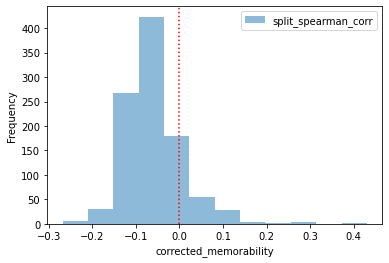

In [217]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.hist(corr_list,bins=12,label='split_spearman_corr',alpha=0.5)
plt.legend()
plt.xlabel('corrected_memorability')
plt.ylabel('Frequency')
plt.axvline(x=0,color='r', linestyle=':')
plt.show()

In [ ]:
#step3: randomly choose half of these => create a new dataframe
#bootstrap version
def split_half(ID_list,num_to_select):
    selected_first = np.random.choice(ID_list, num_to_select)
    selected_second = np.random.choice(ID_list, num_to_select)
    print(selected_first, selected_second)
    first_half = [] 
    second_half = []
    for item in ID_list:
        if item in selected_first:
            selected_df = merged_data.loc[merged_data['ID'] == item]
            if len(first_half)==0:
                first_half = selected_df
            else: 
                first_half = first_half.append(selected_df)
        if item in selected_second:
            unselected_df = merged_data.loc[merged_data['ID'] == item]
            if len(second_half)==0:
                second_half = unselected_df
            else:
                second_half = second_half.append(unselected_df)
    #first_half = pd.DataFrame(first_half)
    #second_half = pd.DataFrame(second_half)
    #print(type(first_half))
    return first_half,second_half

In [ ]:
#step4: calculate memorability
def memorability(image_list,halves):
    dataframe = pd.DataFrame(columns = ['Image', 'memorability', 'false_alarm_rate','corrected_memorability'])
    for i in image_list:
        try:
            image_name = i
            image = halves.loc[halves['image'] == image_name]
            #extract the image as target =>calculate false alarm rate
            target = image.loc[image['typesequence'] == '1']
            n_target = len(target.index)
            false_alarm = target.loc[target['performancesequence'] == '13']
            n_false_alarm = len(false_alarm.index)
            false_alarm_rate = n_false_alarm/n_target
            #extract the image as repeat => calculate memorability
            repeat = image.loc[image['typesequence'] == '2']
            n_repeat = len(repeat.index)
            correct_hit = repeat.loc[repeat['performancesequence'] == '11']
            n_correct_hit = len(correct_hit.index)
            memorability = n_correct_hit/n_repeat
            corrected_memorability = memorability-false_alarm_rate
        except ZeroDivisionError:
            memorability = '0'
            false_alarm_rate = '0'
            n_repeat = '0'
            n_correct_hit = '0'
            n_target = '0'
            n_false_alarm = '0'
            corrected_memorability = '0'
        dataframe = dataframe.append({'Image' : str(i), 'memorability' : float(memorability), 'false_alarm_rate' : float(false_alarm_rate), 'corrected_memorability':float(corrected_memorability)},  
                ignore_index = True)
    print('[INFO]finished!')
    return dataframe

In [ ]:
import numpy as np
corr_list = []
for i in range(1000):
    length = len(id_list)
    #num_to_select = int(length/2)
    num_to_select = 15
    first,second = split_half(id_list,num_to_select)
    first_memorability = memorability(image_list,first)['corrected_memorability']
    print(first_memorability)
    second_memorability = memorability(image_list,second)['corrected_memorability']
    print(second_memorability)
    corr = first_memorability.corr(second_memorability, method='spearman')
    corr_list.append(corr)
print('[INFO]finished!')



In [ ]:
corr_list